In [35]:
# unzip the snapshots file
!unzip -q "/content/snapshots.zip" -d "/content/snapshots"

In [36]:
# setting up device
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [37]:
# loads the initial snapshot of the model
model = torch.load('snapshots/snapshots/epoch0_snap_initial.pt')

In [38]:
model.keys()

odict_keys(['l1.weight', 'l1.bias', 'l2.weight', 'l2.bias', 'l3.weight', 'l3.bias'])

In [39]:
l1_initial = model['l1.weight']
print(l1_initial.shape)
l3_initial = model['l3.weight']
print(l3_initial.shape)

torch.Size([784, 784])
torch.Size([10, 784])


In [40]:
# convert l1 to numpy
l1_initial = l1_initial.cpu().numpy()

In [41]:
# summing all the ingoing edge weights for each node
summed_l1 = l1_initial.sum(axis=1)

Text(0.5, 1.0, 'Initial Model layer 1 weights')

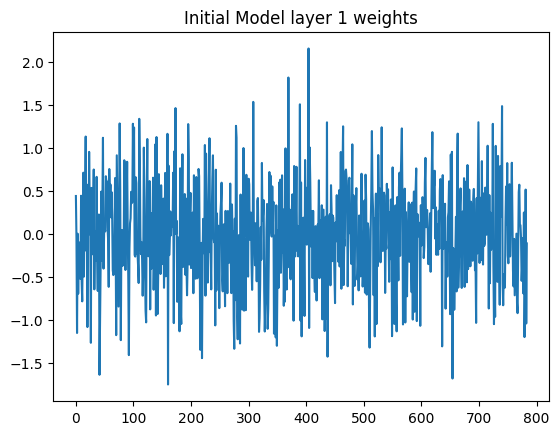

In [42]:
# import plt
import matplotlib.pyplot as plt

# graph the summed l1
plt.plot(summed_l1)
plt.title('Initial Model layer 1 weights')

Text(0.5, 1.0, 'Initial Model layer 1 weights histogram')

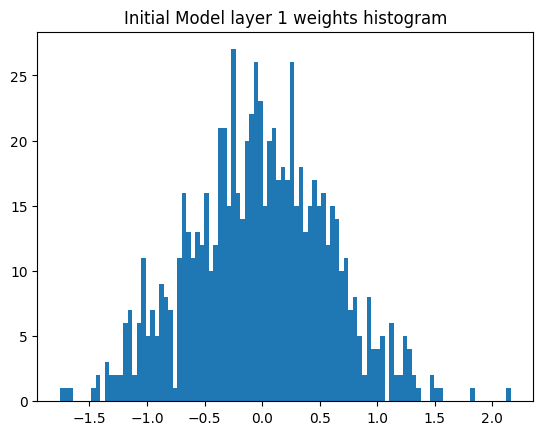

In [43]:
# doing it as a histogram
plt.hist(summed_l1, bins=100);
plt.title('Initial Model layer 1 weights histogram')

It looks like a normal distribution to me. This was the initialization by pytorch. Now we check the same thing for the final model.

In [44]:
model_final = torch.load('snapshots/snapshots/epoch10_snap_final.pt')

Text(0.5, 1.0, 'Final Model layer 1 weights')

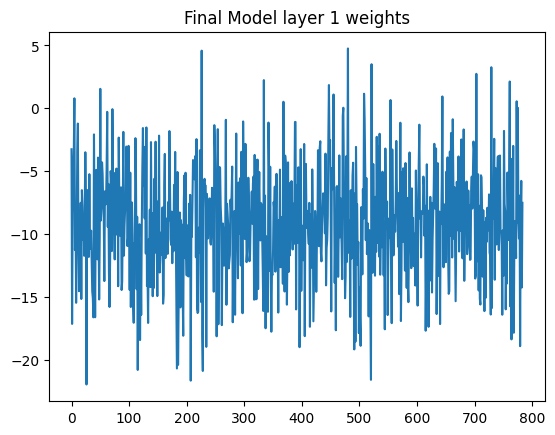

In [45]:
l1_final = model_final['l1.weight']

# convert to numpy
l1_final = l1_final.cpu().numpy()

# summing
summed_l1_final = l1_final.sum(axis=1)

# graph
plt.plot(summed_l1_final)
plt.title('Final Model layer 1 weights')

Text(0.5, 1.0, 'Final Model layer 1 weights histogram')

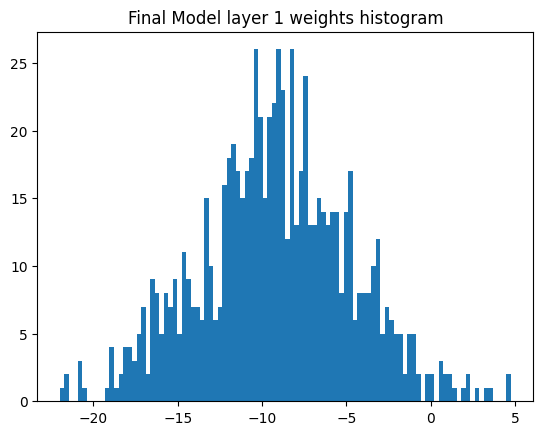

In [46]:
# histogram
plt.hist(summed_l1_final, bins=100);
plt.title('Final Model layer 1 weights histogram')

Also looks like a normal distribution but less variance and the mean is at 10. Let us check if the mean decrease is balanced by increased biases.

Text(0.5, 1.0, 'Final Model layer 1 biases histogram')

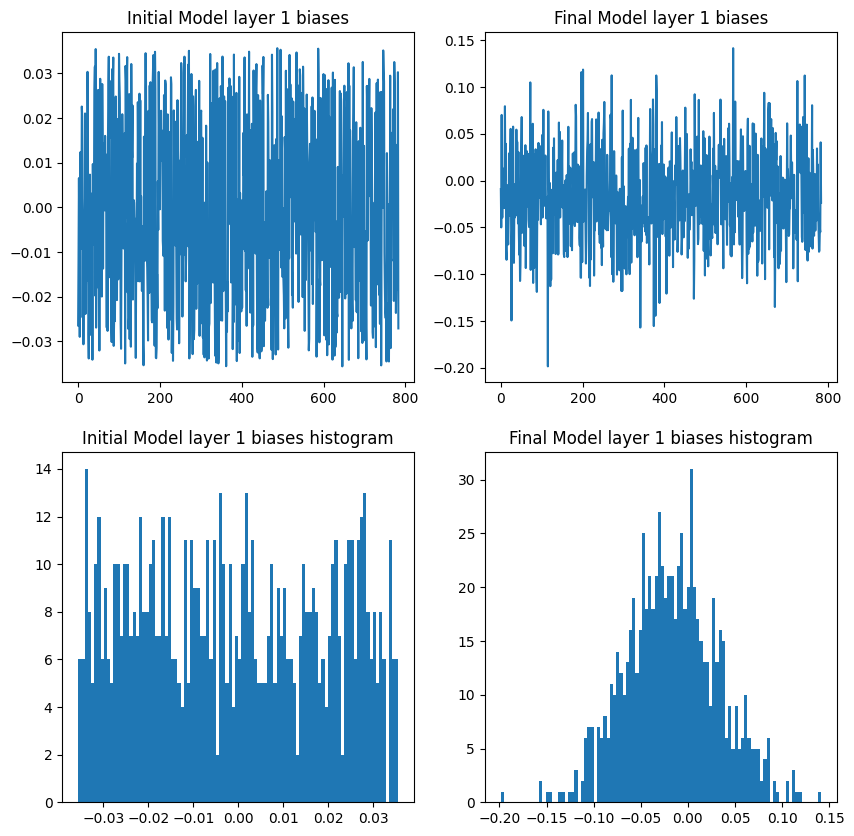

In [47]:
# now for the biases
l1_bias_initial = model['l1.bias']
l1_bias_final = model_final['l1.bias']

# convert to numpy
l1_bias_initial = l1_bias_initial.cpu().numpy()
l1_bias_final = l1_bias_final.cpu().numpy()

# graph on four subplots
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
axs[0][0].plot(l1_bias_initial)
axs[0][0].set_title('Initial Model layer 1 biases')
axs[0][1].plot(l1_bias_final)
axs[0][1].set_title('Final Model layer 1 biases')

# and two for the histograms
axs[1][0].hist(l1_bias_initial, bins=100);
axs[1][0].set_title('Initial Model layer 1 biases histogram')
axs[1][1].hist(l1_bias_final, bins=100);
axs[1][1].set_title('Final Model layer 1 biases histogram')

The biases are centered around 0. So that does not account for anything. But one weird thing is that initailly the biases were uniform, then they became gaussian.

In [48]:
# make an interactive 'video' with sliders representing the snapshot, one for each layer and bias, one as a histogram and once as is

# extract all weight sums
l1_summed_weights = []
l2_summed_weights = []
l3_summed_weights = []
l1_summed_biases = []
l2_summed_biases = []
l3_summed_biases = []

# we begin with initial model
model = torch.load('snapshots/snapshots/epoch0_snap_initial.pt')
l1_summed_weights.append(model['l1.weight'].cpu().numpy().sum(axis=1))
l2_summed_weights.append(model['l2.weight'].cpu().numpy().sum(axis=1))
l3_summed_weights.append(model['l3.weight'].cpu().numpy().sum(axis=1))
l1_summed_biases.append(model['l1.bias'].cpu().numpy())
l2_summed_biases.append(model['l2.bias'].cpu().numpy())
l3_summed_biases.append(model['l3.bias'].cpu().numpy())

# iterate though all files in snapshots/snapshots
for i in range(1, 11):
  for j in range(2, 5):
    # load the model
    model = torch.load(f'snapshots/snapshots/epoch{i}_snap_{j}.pt')
    l1_summed_weights.append(model['l1.weight'].cpu().numpy().sum(axis=1))
    l2_summed_weights.append(model['l2.weight'].cpu().numpy().sum(axis=1))
    l3_summed_weights.append(model['l3.weight'].cpu().numpy().sum(axis=1))
    l1_summed_biases.append(model['l1.bias'].cpu().numpy())
    l2_summed_biases.append(model['l2.bias'].cpu().numpy())
    l3_summed_biases.append(model['l3.bias'].cpu().numpy())

# then we add the final model
model = torch.load('snapshots/snapshots/epoch10_snap_final.pt')
l1_summed_weights.append(model['l1.weight'].cpu().numpy().sum(axis=1))
l2_summed_weights.append(model['l2.weight'].cpu().numpy().sum(axis=1))
l3_summed_weights.append(model['l3.weight'].cpu().numpy().sum(axis=1))
l1_summed_biases.append(model['l1.bias'].cpu().numpy())
l2_summed_biases.append(model['l2.bias'].cpu().numpy())
l3_summed_biases.append(model['l3.bias'].cpu().numpy())


In [49]:
import matplotlib.pyplot as plt
import numpy as np

In [50]:
# now for an animation of l1_weights over time
import matplotlib.animation as animation
from IPython.display import HTML

sequences = [l1_summed_weights, l2_summed_weights, l3_summed_weights, l1_summed_biases, l2_summed_biases, l3_summed_biases]

fig, axes = plt.subplots(2, 3, figsize=(12, 7))
lines = []

# dictionary that maps sequences to titles
titles = {0 : 'L1 weights', 1 : 'L2 weights', 2 : 'L3 weights', 3 : 'L1 biases', 4 : 'L2 biases', 5 : 'L3 biases'}

# Initialize plots
for ax, seq in zip(axes.flat, sequences):
    line, = ax.plot(seq[0])
    lines.append(line)
    ymin = np.min(seq)
    ymax = np.max(seq)
    ax.set_ylim(ymin, ymax)

# Function to update the plots
flat_axes = axes.flat
def update(frame):
    for i, line in enumerate(lines):
        line.set_ydata(sequences[i][frame])
        flat_axes[i].set_title(f"{titles[i]}. Frame: {frame}")
    return lines

ani = animation.FuncAnimation(fig, update, frames=len(sequences[0]), blit=True, interval=100)
plt.close(fig) # prevents an extra plot from rendering at the end

# For Colab: display as HTML
HTML(ani.to_jshtml())

Now same thing but for histograms

In [53]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.animation as animation
from IPython.display import HTML


In [85]:
fig, axes = plt.subplots(2, 3, figsize=(12, 7))
flat_axes = axes.flat

def update(frame):
  for i in range(5):
    flat_axes[i].clear()
    flat_axes[i].hist(sequences[i][frame], bins=100)
    flat_axes[i].set_title(f"{titles[i]} | Frame {frame}")
  return flat_axes

ani = animation.FuncAnimation(fig, update, frames=len(sequences[0]))
plt.close(fig)
HTML(ani.to_jshtml())

Weights maintain their bell shape, but the tails are getting more spread(probably?). And the means are getting considerably negative. The biases started out as a uinform but ended being gaussian which is interesting.  

Now I hypothesize that the nodes that start with larger sums tend to keep being larger.
To test this, sort the initial sums and store the indicies, then reorder the next snapshot with these indicies

In [116]:
# creating multiple sorted indices every 6 iterations
sorted_indices = []
snapshot_idx = []
for i in range(0, len(l1_summed_weights), 6):
  sorted_indices.append(np.argsort(l1_summed_weights[i]))
  snapshot_idx.append(i)
print(len(sorted_indices))

6


In [117]:
# animating the reordered l1 weights
fig, axes = plt.subplots(2, 3, figsize=(12, 7))
flat_axes = axes.flat

def update(frame):
  for i in range(6):
    flat_axes[i].clear()
    flat_axes[i].plot(l1_summed_weights[frame][sorted_indices[i]])
    flat_axes[i].set_title(f"Snapshot: {frame} reordered snapshot: {snapshot_idx[i]}")
  return flat_axes
  # ax.clear()
  # ax.plot(l1_summed_weights[frame][sorted_idx])
  # return ax

ani = animation.FuncAnimation(fig, update, frames=len(sequences[0]))
plt.close(fig)
HTML(ani.to_jshtml())

They are more random than expected but there is still a clear positive correlation